<a href="https://colab.research.google.com/github/Pakhi27/Extracting-Spectrograms-from-Audio-with-Python./blob/main/Extracting_Spectrograms_from_Audio_with_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import librosa
import librosa.display
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt


Loading audio files with Librosa

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
baby_elephant_file="/content/drive/MyDrive/BabyElephantWalk60.wav"
Star_Wars3_file="/content/drive/MyDrive/StarWars3.wav"
Cantina_Band_file="/content/drive/MyDrive/CantinaBand60.wav"
soft_piano="/content/drive/MyDrive/soft-piano-100-bpm-121529.mp3"

In [6]:
ipd.Audio(baby_elephant_file)


In [7]:
ipd.Audio(Star_Wars3_file)

In [8]:
ipd.Audio(Cantina_Band_file)

In [9]:
ipd.Audio(soft_piano)

In [23]:
# load audio files with librosa
scale, sr = librosa.load(baby_elephant_file)
SW, _ = librosa.load(Star_Wars3_file)
CB, _ = librosa.load(Cantina_Band_file)
piano,sr= librosa.load(soft_piano)

Extracting Short-Time Fourier Transform

In [24]:
FRAME_SIZE = 2048
HOP_SIZE = 512



In [25]:
S_scale = librosa.stft(scale, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [26]:
S_scale.shape

(1025, 2584)

In [27]:
type(S_scale[0][0])
# Fourier coefficent is a complex number

numpy.complex64


Calculating the spectrogram

In [28]:
#squaring the results from stft
Y_scale = np.abs(S_scale) ** 2

In [29]:

Y_scale.shape

(1025, 2584)

In [30]:
type(Y_scale[0][0])
# complex to real numver on a spectogram

numpy.float32

Visualising the Spectrum

In [31]:
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y,
                             sr=sr,
                             hop_length=hop_length,
                             x_axis="time",
                             y_axis=y_axis)
    plt.colorbar(format="%+2.f")
    # brighter the color more energy u have in the freq bin
    # base is fundamental freq
    # after that harmonic tones

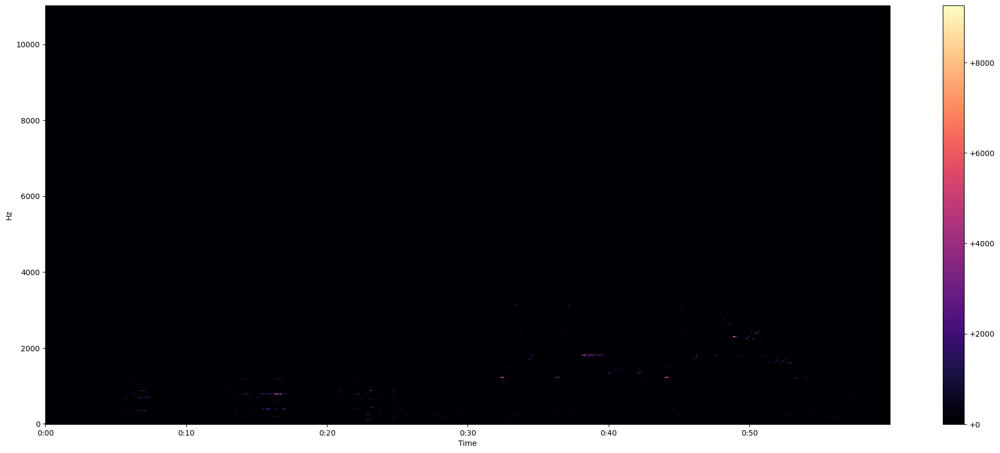

In [32]:
plot_spectrogram(Y_scale, sr, HOP_SIZE)


Log-Amplitude Spectrogram

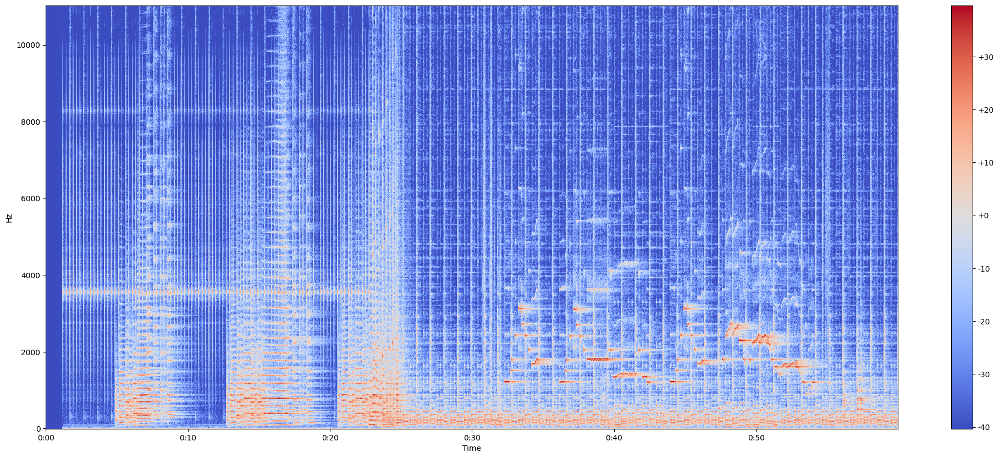

In [33]:
Y_log_scale = librosa.power_to_db(Y_scale)
plot_spectrogram(Y_log_scale, sr, HOP_SIZE)
# linear to logarithmic representation of amplitude


Log-Frequency Spectrogram

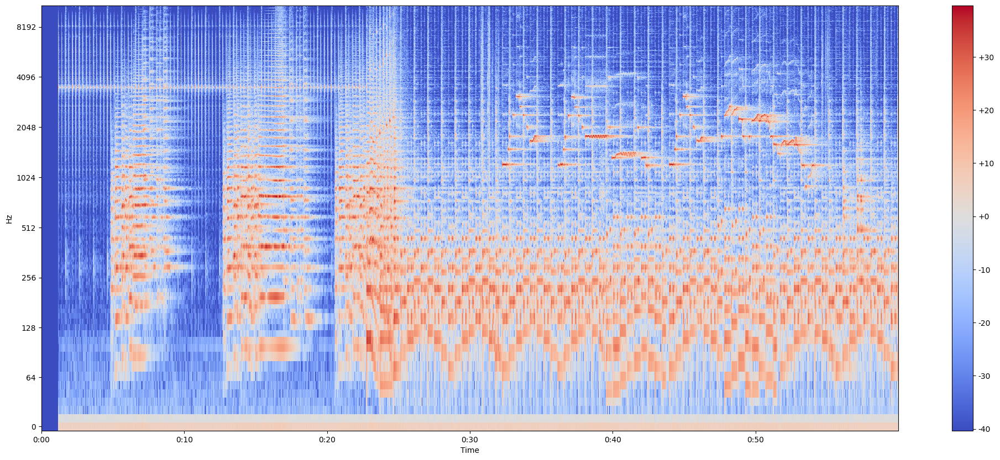

In [34]:
plot_spectrogram(Y_log_scale, sr, HOP_SIZE, y_axis="log")
# Linear way-logarithmic representation of freq


Visualising songs from different genres

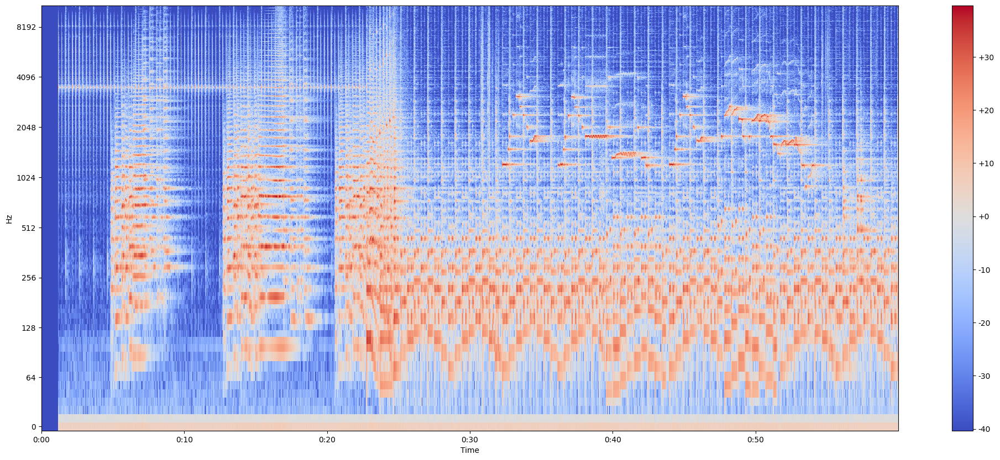

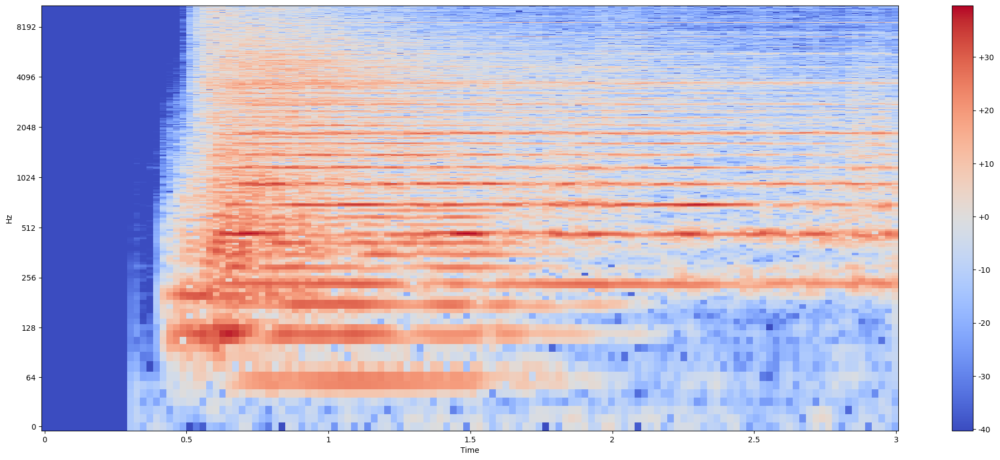

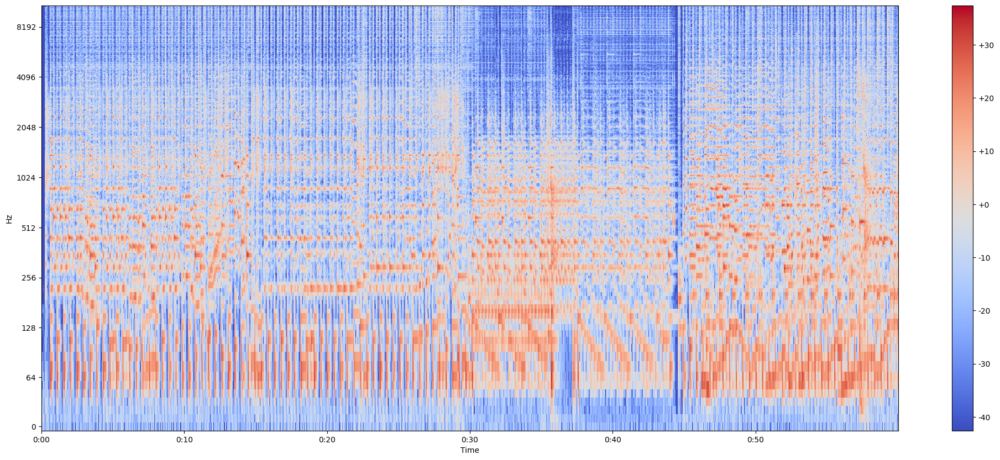

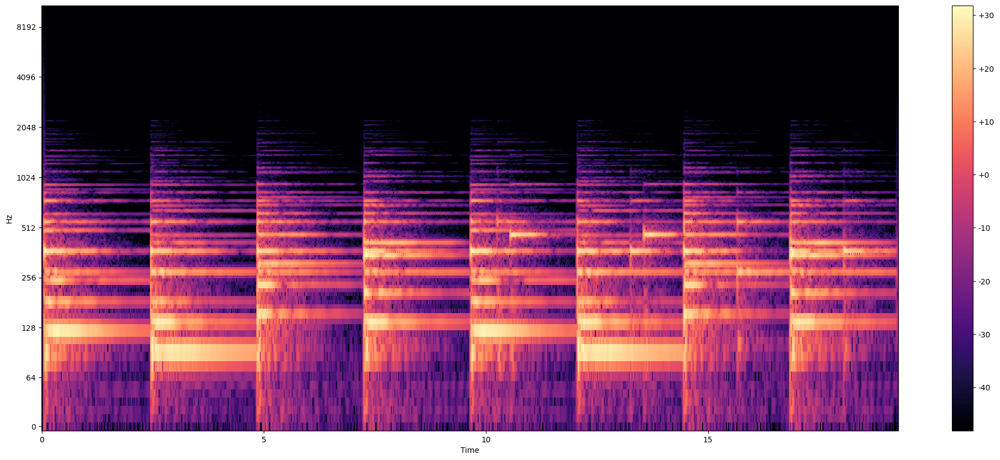

In [36]:

S_BE = librosa.stft(scale, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_SW = librosa.stft(SW, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_CB = librosa.stft(CB, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_piano=librosa.stft(piano, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)


Y_BE = librosa.power_to_db(np.abs(S_BE) ** 2)
Y_SW= librosa.power_to_db(np.abs(S_SW) ** 2)
Y_CB = librosa.power_to_db(np.abs(S_CB) ** 2)
Y_piano = librosa.power_to_db(np.abs(S_piano) ** 2)

plot_spectrogram(Y_BE, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_SW, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_CB, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_piano, sr, HOP_SIZE, y_axis="log")